![MADE](images/made.jpg)

# Академия MADE

## Курс "Компьютерное зрение"

### Семинар 4: Реализация Single-shot Object Detection на примере RetinaNet

Сегодня мы рассмотрим реализацию архитектуры RetinaNet ([arxiv]()) для детектирования объектов за один проход.

#### Материалы для чтения:
1. Оригинальная статья про RetinaNet: [Focal Loss for Dense Object Detection](https://arxiv.org/pdf/1708.02002.pdf)
2. Статья о подходе FPN: [Feature Pyramid Networks for Object Detection](https://arxiv.org/pdf/1612.03144.pdf)
3. Источник кода для семинара: [github/yhenon/pytorch-retinanet](https://github.com/yhenon/pytorch-retinanet)
4. Пост [RetinaNet Explained and Demystified](https://blog.zenggyu.com/en/post/2018-12-05/retinanet-explained-and-demystified/)

#### План
1. (Recap) Подходы к детектированию
2. Реализация компонентов RetinaNet
3. Дообучение RetinaNet

### 1. (Recap) Подходы к детектированию

#### Region-based

* Детектирование на основе регионов (region-based): 
  * Отдельная голова для предсказания возможных областей с объектами (Region Proposal Network, RPN)
  * Отдельные головы для классификации и уточнения границ регионов 
  * Все головы работают поверх признаков, извлеченных "базовой" моделью (она же *backbone*, она же *ствол* и т.д.)
  * Полученные прямоугольники объектов фильтруются с помощью процедуры *Non-maxima suppression (NMS)*
  * Пример: [Faster R-CNN](https://arxiv.org/pdf/1506.01497.pdf) (из семейства R-CNN):
      * Признаки вычисляются один раз и являются "общими" для всех ветвей
      * Голова RPN получает на вход кропы, заданные набором "якорных" прямоугольников (они же *anchor boxes*, *default boxes*, *proposals*, ...)
      * Для каждого кропа предсказывается вероятность содержания в нем объекта и уточняющие координаты границ
      * Отобранные якорные прямоугольники поступают на вход ветвей классификации и регрессии
  
      ![faster_rcnn](images/faster.png)

#### Single shot

* Детектирование "в один проход" (single-shot):
  * Идея с якорными прямоугольниками остается
  * Фактически, перенесли головы для классификации и регресии сразу внутрь RPN
  * Предсказания классов и уточняющих координат производится сразу для всех якорей
  * Пример: [Single Shot Multibox Detector](https://arxiv.org/pdf/1512.02325.pdf)
    * Предсказания собираются с разных глубин базовой сети
    
    ![ssd](images/ssd.png)

#### RetinaNet:

Ключевые особенности RetinaNet:
* Использование специальной функции потерь (*Focal Loss*) 
  * для борьбы с дисбалансом классов при обучении (обычно "объектов" на изображении меньше, чем "фона")
* Комбинирование признаков с разных глубин сети  (*Features Pyramid*) 
  * для "уравнивания" семантической силы нейронов на разных масштабах

### 2. Реализация компонентов RetinaNet

In [1]:
import os
import sys
import cv2
import json
import matplotlib.pyplot as plt

import numpy as np
import torch
from torch import nn
from torchvision.transforms.functional import to_tensor, normalize

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device is:", device)


from visualization import show_image, draw_predictions

Device is: cuda


Подгрузим тестовое изображение и сделаем из него батч размера 1. Это пригодится нам для демонстрации работы отдельных компонентов модели.

In [2]:
def make_tensor(image, device=None):
    tensor = to_tensor(image).unsqueeze(0)
    tensor = normalize(tensor,
                       mean=(0.485, 0.456, 0.406),
                       std=(0.229, 0.224, 0.225))
    if device:
        tensor = tensor.to(device)
    return tensor

Image shape (540, 800, 3)
Tensor size torch.Size([1, 3, 540, 800])


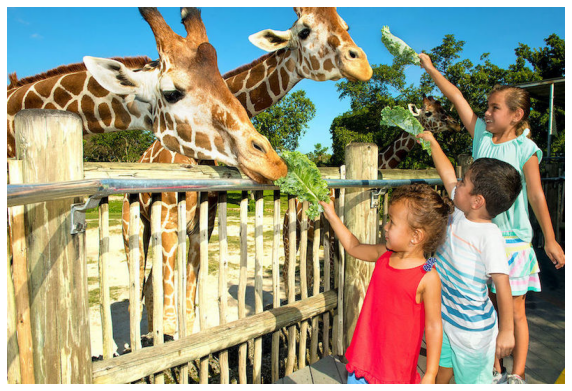

In [3]:
image_example = cv2.imread("images/zoo.jpg")


image_example = cv2.cvtColor(image_example, cv2.COLOR_BGR2RGB)
print("Image shape", image_example.shape)

tensor_example = make_tensor(image_example, device)
print("Tensor size", tensor_example.size())

show_image(image_example)

---

Поскольку модель имеет несколько отдельных модулей, реализуем их и положим в один композиционный класс:

- `RetinaNet`
  - `.backbone` - нейросеть для извлечения признаков; модифицированный `ResNet`, возвращающий карты активаций (вместо логитов);
  - `.fpn` - нейросеть для построения пирамиды признаков из выходов `.backbone`;
  - `.anchor_generator` - класс для построения наборов "якорных" боксов (anchors), на основе которых будет производится поиск объектов;
  - `.cls_head` - нейросеть для классификации каждого из anchor boxes;
  - `.reg_head` - нейросеть для регрессии уточняющих коэффициентов координат каждого из anchor boxes;
  - `.focal_loss` - реализация лосс-функции (да, ее можно поместить прямо в модель).

---

#### Backbone: Модифицированный ResNet

ResNet - семейство архитектур, у которого главная вычислительная единица - это т.н. residual-block:

![residuals](images/residual.png)

Модели `ResNet-*` состоят из блоков, объединенных в четыре слоя (`layerX`); между слоями происходит 1) понижение размерности HW и 2) увеличение "ширины" блоков (число каналов в картах).

**NB: картинка ниже - для сети ResNet-34, в которой используются "простые" all-3x3 residual-блоки, как на картинке выше слева. В ResNet-50 используются `bottleneck`-блоки (соответственно сверху справа).
Число слоев у этих моделей одинаковое (а вот число блоков в слоях и их ширина отличаются).**

![resnet34](images/resnet34.png)

Обычно (для задач типа классификации или регрессии) на выходе модели оказывается вектор (размера `C` = числу классов или 1 - для регрессии).
Но для задачи детектирования понадобятся промежуточные карты активаций, на основе который будет построена пирамида. 
На рисунке выше указаны карты `C3`, `C4` и `C5` - их и должен вернуть метод `.forward` нашей базовой сети.

**Задание**: реализовать метод `.forward()`, который должен возвращать карты активаций после слоев `layer2`, `layer3`, `layer4` в виде списка/кортежа.

In [4]:
from retinanet.utils import BasicBlock, Bottleneck  # See code

class ResNet(nn.Module):

    def __init__(self, num_classes, block, layers_sizes):
        """
        ResNet constructor.
        
        Args:
            - num_classes: int number of outputs for model.
            - block: class to use as residual block in model (BasicBlock or Bottleneck).
            - layers_sizes: list of sizes (number of blocks) for each of the 4 layers.
        """
        self.inplanes = 64
        super(ResNet, self).__init__()
        
        # Input convolution: larger (7x7) and with increased stride (2).
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        
        # Four layers with residual blocks. Each layer has similar structure
        self.layer1 = self._make_layer(block, 64, layers_sizes[0])
        self.layer2 = self._make_layer(block, 128, layers_sizes[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers_sizes[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers_sizes[3], stride=2)
        
    def _make_layer(self, block, planes, num_blocks, stride=1):
        """
        Method to create layer for ResNet using residual blocks.
        
        Args:
            - block: class to use as residual block in model (BasicBlock or Bottleneck).
            - planes: number of channels in layer's activation maps (also known as layer 'width').
            - num_blocks: number of blocks in layer.
            
        Returns:
            nn.Sequential object containing residual blocks.
        """
        downsample = None
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.inplanes, planes * block.expansion,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(planes * block.expansion),
            )

        layers = [block(self.inplanes, planes, stride, downsample)]
        self.inplanes = planes * block.expansion
        for i in range(1, num_blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)
    
    def forward(self, inputs):
        """
        Method for "__call__".
        
        Args:
            - inputs: batch of images shaped Bx3xHxW.
            
        Returns:
            List of feature maps tensors from layers 2, 3, 4.
        """
        
        # TODO: 
        # Write code to run all the model layers (do not forget to run input convolution/bn/activation/pooling) 
        # and to return feature maps from layer2, layer3, layer4.
        
        ### YOUR CODE HERE
        
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        x1 = self.layer1(x)
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        
        ### END OF YOUR CODE
        
        return (x2, x3, x4)

In [5]:
num_classes = 80

print("ResNet50:")
resnet50_layers_sizes = [3, 4, 6, 3]      
resnet50 = ResNet(num_classes=num_classes, block=Bottleneck, layers_sizes=resnet50_layers_sizes).to(device)

print(resnet50)

ResNet50:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), s

In [6]:
print("Feature maps sizes from layer2-4 of ResNet50:")
feature_maps_example = resnet50(tensor_example)
for fm in feature_maps_example:
    print(fm.size())

Feature maps sizes from layer2-4 of ResNet50:
torch.Size([1, 512, 68, 100])
torch.Size([1, 1024, 34, 50])
torch.Size([1, 2048, 17, 25])


---

#### Feature Pyramid: собираем пирамиду активаций

Теперь перейдем к модулю, который сделает из последовательности карт активаций пирамиду.

Идея `Feature Pyramid` в том, чтобы, скомбинировав карты с разных слоев основной сети (`backbone`), получить карты одновременно "семантически богатые" и с большим рецептивным полем.

![fpn](images/fpn.png)

На рисунке выше изображена пирамида из 3 уровней. Авторы [оригинальной статьи](https://arxiv.org/pdf/1708.02002.pdf) указывают (примечание на стр.4), что в их пирамиде 5 слоев, которые обозначаются от $P_3$ до $P_7$. При этом соответствие слоев пирамиды картам активации такое: $C_3 - P_3$, $C_4 - P_4$, $C_5 - P_5$, а два дополнительных слоя пирамиды $P_6$ и $P_7$ получаются последовательно свертками из $P_5$ (уже без сложения с низкоуровневыми картами)

Каждая из карт $C_i$ ($C_5$ - $C_3$):
1. Сворачивается с ядром 1х1, получается $C'_i$
2. Суммируется с выходной картой выше $C'_{i+1}$ (нет у $C_5$), увеличенной вдвое, и после свертки с ядром 3х3 отправляется на выход ($P_i$).

**Задание**: реализовать кусок метода `.forward()` для вычисления `P3` (по аналогии с `P5` & `P6`).

In [7]:
class PyramidFeatures(nn.Module):
    
    def __init__(self, C3_size, C4_size, C5_size, feature_size=256):
        """
        FPN constructor.
        
        Args:
            - C3_size: num features in C3 map.
            - C4_size: num features in C4 map.
            - C5_size: num features in C5 map.
            - feature_size: num features in output maps.
        """
        super(PyramidFeatures, self).__init__()

        # For P5
        self.P5_1 = nn.Conv2d(C5_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P5_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P5_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # For P4
        self.P4_1 = nn.Conv2d(C4_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P4_upsampled = nn.Upsample(scale_factor=2, mode='nearest')
        self.P4_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)

        # For P3
        self.P3_1 = nn.Conv2d(C3_size, feature_size, kernel_size=1, stride=1, padding=0)
        self.P3_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=1, padding=1)
        
        # For P6 
        # "P6 is obtained via a 3x3 stride-2 conv on C5"
        self.P6 = nn.Conv2d(C5_size, feature_size, kernel_size=3, stride=2, padding=1)

        # For P7
        # "P7 is computed by applying ReLU followed by a 3x3 stride-2 conv on P6"
        self.P7_1 = nn.ReLU()
        self.P7_2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, stride=2, padding=1)

    def forward(self, inputs):
        """
        Method for "__call__".
        
        Args:
            - inputs: List of C3, C4, C5 activation maps from backbone.
            
        Returns:
            List of pyramid feature maps from P3 to P7.
        """
        C3, C4, C5 = inputs

        P5_x = self.P5_1(C5)
        P5_upsampled_x = self.P5_upsampled(P5_x)
        P5_x = self.P5_2(P5_x)

        P4_x = self.P4_1(C4)
        P4_x = P5_upsampled_x + P4_x
        P4_upsampled_x = self.P4_upsampled(P4_x)
        P4_x = self.P4_2(P4_x)
        
        # TODO: 
        # Write code to compute P3_x output map.
        # Almost like P4_x & P5_x, but no need for upsampling itself
        # (as we do not have 'lower' map P2)
        
        # YOUR CODE HERE
        
        P3_x = self.P3_1(C3)
        P3_x = P4_upsampled_x + P3_x
        P3_x = self.P3_2(P3_x)       
        
        # END OF YOUR CODE
        

        P6_x = self.P6(C5)

        P7_x = self.P7_1(P6_x)
        P7_x = self.P7_2(P7_x)

        return (P3_x, P4_x, P5_x, P6_x, P7_x)

In [8]:
fpn_sizes = (512, 1024, 2048)  # ResNet50
fpn = PyramidFeatures(*fpn_sizes).to(device)

print("Feature pyramid sizes:")
features_pyramid_example = fpn(feature_maps_example)
for fp in features_pyramid_example:
    print(fp.size())

Feature pyramid sizes:
torch.Size([1, 256, 68, 100])
torch.Size([1, 256, 34, 50])
torch.Size([1, 256, 17, 25])
torch.Size([1, 256, 9, 13])
torch.Size([1, 256, 5, 7])


Обратим внимание:
* У первого слоя (который мы называем $P_3$) линейные размеры в 8 = $2^3$ раз меньше, чем у оригинального изображения.
* На каждом слое пирамиды линейные размеры уменьшаются вдвое.

То есть размеры слоя $P_i$ меньше размеров исходного изображения в $2^i$ раз.

---

На данный момент у нас есть инструменты для извлечения карт признаков из изображения. 

Теперь, если бы мы работали в парадигме, например, `Fast R-CNN` (не надо так), мы бы запустили на этих признаках алгоритм `SelectiveSearch`, получили координаты предполагаемых локаций с объектами (в виде обрамляющих прямоугольников), "вырезали" их проекции из каждого слоя пирамиды признаков и подали в подсети для определения классов и регрессии относительных координат.

Но, поскольку мы работаем в парадигме single-shot-детектирования, мы сделаем все за один проход. 
С каждым супер-пикселем любого из слоев пирамиды (супер-пиксель - это одна точка (x, y) на карте признаков) мы ассоциируем некоторую область на исходном изображении, и для каждой такой области назначим набор т.н. `proposals`, то есть предполагаемых обрамляющих прямоугольников, лежащих в этой области.

![subnet2](images/subnet_receptive_2.jpeg) ![subnet](images/subnet_receptive.jpeg)


Эти наборы нужны для того, чтобы связать суперпиксели активационных карт с ground-truth объектами при обучении. 

---

#### Anchors generator

В качестве основы для набора `proposals` возьмем три прямоугольника: "горизонтальный" (соотношение сторон H:W = 1:2, в коде - `ratio`), "квадрат" (H:W = 1:2) и "вертикальный" (H:W = 2:1).

Если кроме 3 вариантов соотношения сторон взять 3 варианта для масштаба, получим набор из 9 прямоугольников. 

![1](images/proposals.png)


После того, как зафиксирован набор `proposals` для одного супер-пикселя, нужно отобразить все прямоугольники (для всех супер-пикселей на всех уровнях пирамиды) на исходное изображение, чтобы связать их с ground-truth прямоугольниками объектов.

Класс `AnchorsGenerator` нужен затем, чтобы сгенерировать наборы `proposals` для всех слоев, раскидать их по сетке и спроецировать на исходное изображение.

**NB: Конкретные положения прямоугольников зависят как от гипер-параметров генератора, так и от размеров изображения!**

In [9]:
from retinanet.anchors import generate_anchors, shift 


class AnchorsGenerator(nn.Module):
    
    def __init__(self, pyramid_levels=None, strides=None, sizes=None, ratios=None, scales=None, device=None):
        """
        AnchorGenerator constructor.
        
        Args:
            - pyramid_levels: list of log_2(image_width / pyramid_level_width) for every pyramid level.
            - strides: list of step sizes for sliding each anchor box set for every pyramid level.
            - sizes: list of basic sizes for anchor boxes for every pyramid level.
            - ratios: list of anchor boxes aspect ratio sets for every pyramid level.
            - scales: list of anchor boxes scale sets for every pyramid level.
            - device: device to move results to.
        """
        super(AnchorsGenerator, self).__init__()

        if pyramid_levels is None:
            self.pyramid_levels = [3, 4, 5, 6, 7]
        if strides is None:
            self.strides = [2 ** x for x in self.pyramid_levels]
        if sizes is None:
            self.sizes = [2 ** (x + 2) for x in self.pyramid_levels]
        if ratios is None:
            self.ratios = np.array([0.5, 1, 2])
        if scales is None:
            self.scales = np.array([2 ** 0, 2 ** (1.0 / 3.0), 2 ** (2.0 / 3.0)])

        if device is None:
            device = torch.cuda.is_available() and 'cuda' or 'cpu'
        self.device = device

    def forward(self, image, verbose=False):
        """
        Method for "__call__".
        
        Args:
            - image: tensor of shape B x C x H x W.
            
        Returns:
            tensor of computed anchor box coordinatates, size total_num_anchors x 4.
        """
        image_shape = image.shape[2:]  # h, w
        image_shape = np.array(image_shape)
        image_shapes = [(image_shape + 2 ** x - 1) // (2 ** x) for x in self.pyramid_levels]

        # Compute anchors over all pyramid levels
        
        all_anchors = np.zeros((0, 4)).astype(np.float32)

        for idx, p in enumerate(self.pyramid_levels):
            
            # Generate 9 anchors
            anchors = generate_anchors(base_size=self.sizes[idx], ratios=self.ratios, scales=self.scales)
            
            # Grid all over the shape with stride
            shifted_anchors = shift(image_shapes[idx], self.strides[idx], anchors)
            
            if verbose:
                print(f"{idx}\tpyr_level = {p}\tstride = {self.strides[idx]:3d}\tsize={self.sizes[idx]:3d}\tanchors shape = {shifted_anchors.shape}")
            
            all_anchors = np.append(all_anchors, shifted_anchors, axis=0)

        all_anchors = np.expand_dims(all_anchors, axis=0)

        return torch.from_numpy(all_anchors.astype(np.float32)).to(self.device)

In [10]:
anchors_generator = AnchorsGenerator(device=device)

anchors_example = anchors_generator(tensor_example, verbose=True)[0].cpu()
print()
print(anchors_example.size())

0	pyr_level = 3	stride =   8	size= 32	anchors shape = (61200, 4)
1	pyr_level = 4	stride =  16	size= 64	anchors shape = (15300, 4)
2	pyr_level = 5	stride =  32	size=128	anchors shape = (3825, 4)
3	pyr_level = 6	stride =  64	size=256	anchors shape = (1053, 4)
4	pyr_level = 7	stride = 128	size=512	anchors shape = (315, 4)

torch.Size([81693, 4])


Получили общее число `proposals`, каждый из которых задается четырьмя числами - x1, y1, x2, y2.

Отрисуем по несколько полученных прямоугольников с каждого слоя на исходном изображении.

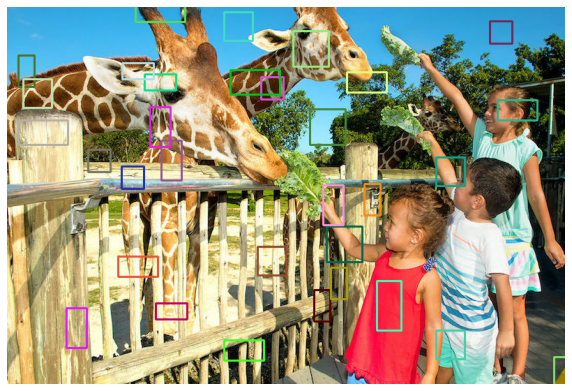

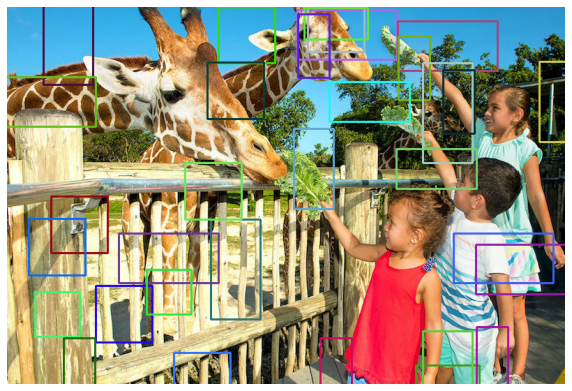

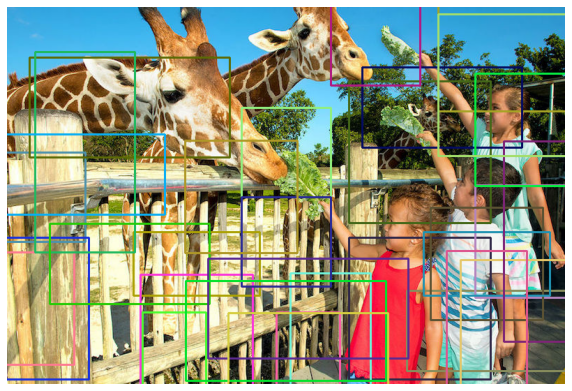

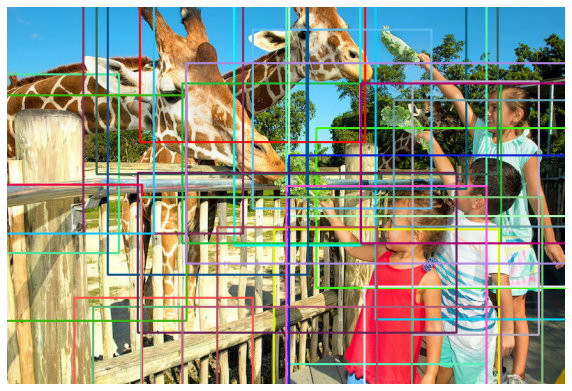

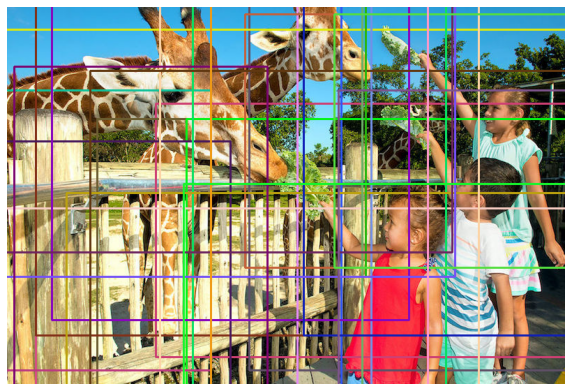

In [11]:
anchors_num_per_level = [61200, 15300, 3825, 1053, 315]
anchors_per_level = np.split(anchors_example, np.cumsum(anchors_num_per_level)[:-1])

num_to_show = 32
for anchor_boxes_level in anchors_per_level:
    image_example_with_anchors = image_example.copy()
    for i in np.random.choice(len(anchor_boxes_level), size=num_to_show):
        anchor_box = anchor_boxes_level[i]
        x1, y1, x2, y2 = anchor_box.numpy().astype(np.int32)
        cv2.rectangle(image_example_with_anchors, (x1, y1), (x2, y2), np.random.randint(255, size=3).tolist(), 2)
    
    show_image(image_example_with_anchors)

Теперь, когда у нас есть модуль для генерации якорных прямоугольников, можем перейти к сеткам для классификации и регрессии на их основе.

---

#### Regression & Classification subnets

Классификацию (объект одного из классов или фон) и регрессию (уточнение координат объекта относительно `anchor box`) будет делать в сверточной манере.

![overall](images/overall.png)

* Регрессия

Поскольку с каждым супер-пикселем у нас ассоциировано 9 разных `proposals`, каждый из которых задан с помощью 4 чисел, то для регрессии нам потребуется 9 x 4 = 36 чисел в каждом суперпикселе. Значит, сделаем полносверточную сеть, которая не меняет размера карт активаций (то есть нет `pooling`-слоев и `stride`=1) и имеет на выходе 36 каналов. Таким образом, в каждом из `HxW` суперпикселей выходной карты будут храниться все необходимые таргеты.

**Задание:** напишите код для преобразования тензора с результатами из вида `B x (num_anchors * 4) x H x W` к виду `B x total_num_anchors x 4`.

In [12]:
class RegressionModel(nn.Module):
    
    def __init__(self, num_features_in, num_anchors=9, feature_size=256):
        """
        RegressionModel consctructor. 
        
        RegressionModel is a fully-convolutional neural network that takes single feature pyramid level and
        outputs tensor of size total_number_of_anchors x 4.
        
        Args:
            - num_features_in: number of channels in every feature pyramid level.
            - num_anchors: size of anchor boxes set.
            - feature_size: size of internal activation maps.
        """
        super(RegressionModel, self).__init__()

        self.conv1 = nn.Conv2d(num_features_in, feature_size, kernel_size=3, padding=1)
        self.act1 = nn.ReLU()

        self.conv2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act2 = nn.ReLU()

        self.conv3 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act3 = nn.ReLU()

        self.conv4 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act4 = nn.ReLU()

        self.output = nn.Conv2d(feature_size, num_anchors * 4, kernel_size=3, padding=1)

    def forward(self, x):
        """
        Run regression on single feature pyramid level.
        
        Args:
            - x: feature pyramid level of shape B x num_features_in x H x W.
            
        Returns:
            tensor of size B x (H * W * num_anchors) x 4.
        """
        out = self.conv1(x)
        out = self.act1(out)

        out = self.conv2(out)
        out = self.act2(out)

        out = self.conv3(out)
        out = self.act3(out)

        out = self.conv4(out)
        out = self.act4(out)

        out = self.output(out)
        # out is B x C x W x H, with C = 4 * num_anchors
        
        # TODO: change shape of `out` tensor to be `B x total_num_anchors x 4`.
        
        # YOUR CODE HERE
        
        out = out.permute(0, 2, 3, 1)
        out = out.reshape(out.shape[0], -1, 4)

        # END OF YOUR CODE
        
        return out

In [13]:
num_features_in = 256
regression_head = RegressionModel(num_features_in).to(device)

regression_predictions = []
for features in features_pyramid_example:
    regression_predictions_at_level = regression_head(features)
    regression_predictions.append(regression_predictions_at_level)
    print(f"input: {features.size()}\t output: {regression_predictions_at_level.size()}")
regression_predictions = torch.cat(regression_predictions, dim=1) # batch x anchors x 4 [4 for bbox]

input: torch.Size([1, 256, 68, 100])	 output: torch.Size([1, 61200, 4])
input: torch.Size([1, 256, 34, 50])	 output: torch.Size([1, 15300, 4])
input: torch.Size([1, 256, 17, 25])	 output: torch.Size([1, 3825, 4])
input: torch.Size([1, 256, 9, 13])	 output: torch.Size([1, 1053, 4])
input: torch.Size([1, 256, 5, 7])	 output: torch.Size([1, 315, 4])


* Классификация

Архитектурно голова классификации идентична голове регрессии, отличие только в размере выхода (и активации): модель возвращает столько значений для каждого бокса, сколько классов в датасете, причем с активацией `Sigmoid`.

In [14]:
class ClassificationModel(nn.Module):
    
    def __init__(self, num_features_in, num_anchors=9, num_classes=80, prior=0.01, feature_size=256):
        """
        ClassificationModel consctructor. 
        
        ClassificationModel is a fully-convolutional neural network that takes single feature pyramid level and
        outputs tensor of size total_number_of_anchors x num_classes.
        
        Args:
            - num_features_in: number of channels in every feature pyramid level.
            - num_anchors: size of anchor boxes set.
            - num_classes: number of classes in dataset (do not count the `background` class!).
            - prior: float number to use in weights initializatin.
            - feature_size: size of internal activation maps.
        """
        super(ClassificationModel, self).__init__()

        self.num_classes = num_classes
        self.num_anchors = num_anchors

        self.conv1 = nn.Conv2d(num_features_in, feature_size, kernel_size=3, padding=1)
        self.act1 = nn.ReLU()

        self.conv2 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act2 = nn.ReLU()

        self.conv3 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act3 = nn.ReLU()

        self.conv4 = nn.Conv2d(feature_size, feature_size, kernel_size=3, padding=1)
        self.act4 = nn.ReLU()

        self.output = nn.Conv2d(feature_size, num_anchors * num_classes, kernel_size=3, padding=1)
        self.output_act = nn.Sigmoid()

    def forward(self, x):        
        """
        Run classification on single feature pyramid level.
        
        Args:
            - x: feature pyramid level of shape B x num_features_in x H x W.
            
        Returns:
            tensor of size B x (H * W * num_anchors) x num_classes.
        """
        out = self.conv1(x)
        out = self.act1(out)

        out = self.conv2(out)
        out = self.act2(out)

        out = self.conv3(out)
        out = self.act3(out)

        out = self.conv4(out)
        out = self.act4(out)

        out = self.output(out)
        out = self.output_act(out)
        # out is B x C x W x H, with C = num_classes * num_anchors
        
        out1 = out.permute(0, 2, 3, 1)
        batch_size, width, height, channels = out1.shape
        out2 = out1.reshape(batch_size, width, height, self.num_anchors, self.num_classes)

        return out2.reshape(x.shape[0], -1, self.num_classes)

In [15]:
classification_head = ClassificationModel(num_features_in, num_classes=num_classes).to(device)
classification_results = []

for feature in features_pyramid_example:
    classification_results_at_level = classification_head(feature)
    classification_results.append(classification_results_at_level)
    print(f"input: {feature.size()}\t output: {classification_results_at_level.size()}")
classification_results = torch.cat(classification_results, dim=1) # batch x anchors x classes

input: torch.Size([1, 256, 68, 100])	 output: torch.Size([1, 61200, 80])
input: torch.Size([1, 256, 34, 50])	 output: torch.Size([1, 15300, 80])
input: torch.Size([1, 256, 17, 25])	 output: torch.Size([1, 3825, 80])
input: torch.Size([1, 256, 9, 13])	 output: torch.Size([1, 1053, 80])
input: torch.Size([1, 256, 5, 7])	 output: torch.Size([1, 315, 80])


Теперь мы можем объединить все в одну композицию, класс `RetinaNet`.

---

#### RetinaNet

In [16]:
from retinanet.utils import BBoxTransform, ClipBoxes
from retinanet.losses import FocalLoss
from torchvision.ops import nms

Из интересного: метод `.forward()` работает по разному во время обучения и во время инференса:
- Во время обучения (`self.training = True`) функция возвращает список из двух лоссов - регрессионного и классификационного.
- Во время инференса функция возвращает предсказания: скоры, индексы классов и координаты боксов. 

Также помимо уже разобранных модулей будут использоваться:
- `BBoxTransform`: класс для сборки боксов из предсказаний регрессионной головы и набора якорных боксов.
- `ClipBoxes`: класс для усечения координат боксов при выходе за границы изображения.
- `FocalLoss`: класс для вычисления сложной функции потерь (на самом деле, в нем вычисляются оба лосса - для классификации и для регрессии).
  Внутри него происходит, например, ассоциация GT-боксов с якорными боксами.

In [17]:
class RetinaNet(nn.Module):
    
    def __init__(self, num_classes, backbone="resnet50", fpn_feature_size=256, subnets_feature_size=256, device=None):
        super(RetinaNet, self).__init__()
        
        self.device = device
        if backbone == "resnet50":
            self.backbone = ResNet(num_classes=num_classes, block=Bottleneck, layers_sizes=(3, 4, 6, 3)).to(device)
            self.fpn = PyramidFeatures(512, 1024, 2048, fpn_feature_size).to(device)
            
        else:
            raise NotImplementedError(backbone)
            
        self.regression_head = RegressionModel(num_features_in=fpn_feature_size, feature_size=subnets_feature_size).to(device)
        self.classification_head = ClassificationModel(num_features_in=fpn_feature_size, num_classes=num_classes, feature_size=subnets_feature_size).to(self.device)
        self._init_weights()
        
        self.anchors_generator = AnchorsGenerator(device=device)
        self.transform_bboxes = BBoxTransform(device=device)
        self.clip_bboxes = ClipBoxes()
        self.loss_fn = FocalLoss(device=device)
        

    def forward(self, inputs):
        """
        Apply RetinaNet pipeline to inputs.
        
        Args:
            - inputs: Either (images_batch, annotations) in training mode or images_batch otherwise. 
            images_batch is of shape (B x C x H x W), annotations of shape (B x N x 5) where N is a number of 
            GT boxes and 5 = 4 coords + 1 class label.
        
        Returns:
            Either (classification_loss, regression_loss) in training mode or (scores, nms_class, boxes) otherwise.
        """
        
        if self.training:
            images_batch, annotations = inputs
        else:
            images_batch = inputs
        
        features = self.backbone(images_batch.to(device))
        features_pyramid = self.fpn(features)
        classification_results = torch.cat([self.classification_head(f) for f in features_pyramid], dim=1)
        regression_results = torch.cat([self.regression_head(f) for f in features_pyramid], dim=1)
        
        anchors = self.anchors_generator(images_batch)
        
        if self.training:
            return self.loss_fn(classification_results, regression_results, anchors, annotations)
        
        transformed_anchors = self.transform_bboxes(anchors, regression_results)
        transformed_anchors = self.clip_bboxes(transformed_anchors, images_batch)

        scores = torch.max(classification_results, dim=2, keepdim=True)[0]
        scores_over_thresh = (scores > 0.05)[0, :, 0]

        if scores_over_thresh.sum() == 0:
            # no boxes to NMS, just return
            return [torch.zeros(0), torch.zeros(0), torch.zeros(0, 4)]

        # NMS iteratively removes lower scoring boxes which have an
        # IoU greater than iou_threshold with another (higher scoring) box
        classification_results = classification_results[:, scores_over_thresh, :]
        transformed_anchors = transformed_anchors[:, scores_over_thresh, :]
        scores = scores[:, scores_over_thresh, :]

        anchors_nms_idx = nms(transformed_anchors[0,:,:], scores[0,:,0], 0.5)

        nms_scores, nms_class = classification_results[0, anchors_nms_idx, :].max(dim=1)

        return [nms_scores, nms_class, transformed_anchors[0, anchors_nms_idx, :]]
    
    def _init_weights(self):
        
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, np.sqrt(2. / n))
            elif isinstance(m, nn.BatchNorm2d):
                m.weight.data.fill_(1)
                m.bias.data.zero_()

        prior = 0.01

        self.classification_head.output.weight.data.fill_(0)
        self.classification_head.output.bias.data.fill_(-np.log((1.0 - prior) / prior))

        self.regression_head.output.weight.data.fill_(0)
        self.regression_head.output.bias.data.fill_(0)

Подгрузим веса из оригинального репозитория (модифицированные для нашего класса) и сделаем пробный прогон на тестовом изображении. Веса получены обучением модели на датасете COCO.

In [18]:
retinanet = RetinaNet(num_classes=80, device=device)
retinanet.eval();

In [19]:
with open("./FIXED_coco_resnet_50_map_0_335_state_dict.pt", "rb") as fp:
    state_dict = torch.load(fp, map_location="cpu")
retinanet.load_state_dict(state_dict)

<All keys matched successfully>

Взглянем на результат работы модели на тестовом примере:

In [20]:
def run_and_show(model, image_or_tensor, threshold, class_to_label_map, verbose=False):
    if isinstance(image_or_tensor, np.ndarray):
        tensor = make_tensor(image_or_tensor)
        image = image_or_tensor
    elif isinstance(image_or_tensor, torch.Tensor):
        image = (image_or_tensor.numpy()[0] * 0.25) + 0.5
        tensor = image_or_tensor.permute(0, 3, 1, 2)
    else:
        raise NotImplementedError(type(image_or_tensor))
        
    with torch.no_grad():
        nms_scores, nms_classes, bboxes = model(tensor)
    
    nms_scores = nms_scores.cpu()
    nms_classes = nms_classes.cpu()
    bboxes = bboxes.cpu()
    
    if verbose:
        print(nms_scores.size(), nms_scores[:8])
        print(nms_classes.size(), nms_classes[:8])
        print(bboxes.size(), bboxes[:8])
        
    image_with_predictions = draw_predictions(image, bboxes, nms_scores, nms_classes, class_to_label_map, threshold=threshold)
    show_image(image_with_predictions)

In [21]:
with open("./coco_id_to_name.json", "rt") as fp:
    coco_class_to_label_map = json.load(fp)
coco_class_to_label_map = {int(k) - 1: v for k, v in coco_class_to_label_map.items()}

torch.Size([37]) tensor([0.9233, 0.9152, 0.9048, 0.6975, 0.6942, 0.6544, 0.3873, 0.3595])
torch.Size([37]) tensor([ 0,  0, 23,  0, 23,  0, 23,  0])
torch.Size([37, 4]) tensor([[449.5888, 243.1150, 640.3466, 536.0121],
        [576.0060,  65.7283, 788.5273, 520.0206],
        [  0.0000,   2.5446, 432.3901, 262.7661],
        [593.4430, 188.3436, 734.5757, 538.8125],
        [160.2017,   6.6155, 513.5728, 313.3863],
        [505.8370, 190.7568, 704.4647, 529.6027],
        [  0.0000,  10.8027, 460.2867, 506.0140],
        [676.0553, 136.6647, 793.7506, 534.0100]])


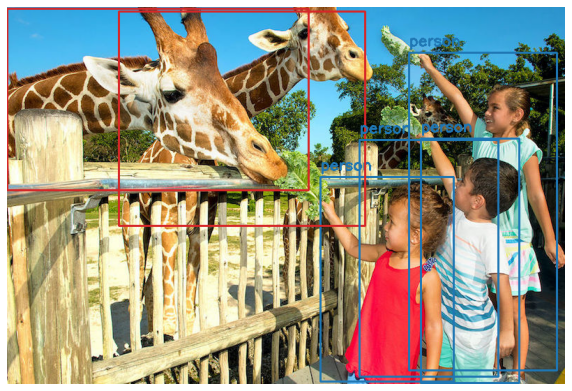

In [22]:
run_and_show(retinanet, image_example, 0.5, coco_class_to_label_map, verbose=True)

---

#### 3. Дообучение RetinaNet

Наконец, убедимся в том, что наша модель может обучаться. 

У нас есть кусок датасета [OpenImages](https://storage.googleapis.com/openimages/web/index.html), которая содержит примеры класса `Ball`.
Будем обучать нашу модель детектировать 1 класс - мячи, шары и т.д.


Подгрузка данных:

In [23]:
import tqdm

from torchvision import transforms
from torch.utils.data import DataLoader

from dataset import DetectionDataset

from retinanet.dataloader import Normalizer, Resizer, Augmenter, collater, AspectRatioBasedSampler

In [24]:
train_transforms = transforms.Compose([
    Normalizer(), Augmenter(), Resizer()
])

val_transforms = transforms.Compose([
    Normalizer(), Resizer()
])

Теперь к созданию датасетов и даталоадеров.

Обратите внимание на `AspectRatioBasedSampler`: 
* Для обучения моделей в `pytorch` необходимо, чтобы все элементы в батче были одного размера.
* Поскольку мы учим полносверточную архитектуру на полных изображениях (а не на кропах, как в классификации), то нам нужно отресайзить их к одному размеру. 
Если у изображений разное соотношение сторон, мы будем добавлять рамки (padding).
* `AspectRatioBasedSampler` группирует изображения в датасете таким образом, чтобы в батч попадали изображения с как можно более похожим соотношением сторон, чтобы не делать слишком большие паддинги.

Датасеты устроены так, чтобы возвращать тензор изображения и тензор аннотаций к нему.

In [25]:
train_dataset = DetectionDataset(data_dict_file="./oi5_ball_filename_to_bbox_train.json", transforms=train_transforms)
train_sampler = AspectRatioBasedSampler(train_dataset, batch_size=2, drop_last=False) # deepdive
train_dataloader = DataLoader(train_dataset, num_workers=8, collate_fn=collater, batch_sampler=train_sampler)

val_dataset = DetectionDataset(data_dict_file="./oi5_ball_filename_to_bbox_val.json", transforms=val_transforms)
val_sampler = AspectRatioBasedSampler(val_dataset, batch_size=2, drop_last=False)
val_dataloader = DataLoader(val_dataset, num_workers=8, collate_fn=collater, batch_sampler=val_sampler)

In [26]:
item = train_dataset[0]
print(item["img"].size())    # H x W x 3
print(item["annot"].size())  # N x 5; 4 coords + 1 label.

torch.Size([640, 992, 3])
torch.Size([6, 5])


Теперь непосредственно к модели.

Во-первых, нужно заменить головы для классификации и регрессии для дообучения.
При этом у классификационной головы нужно указать число классов - 1.

In [27]:
retinanet.classification_head = ClassificationModel(num_features_in, num_classes=1)
retinanet.regression_head = RegressionModel(num_features_in)
retinanet.to(device);

Во-вторых, потребуется функция для переключения модулей нашей сети в режим обучения; сделаем так, чтобы можно было учить отдельные модули.

**Вопрос**: зачем "замораживать" BN?

In [28]:
def set_to_training(model, backbone=False, fpn=False, regression_head=True, classification_head=True, freeze_bn=False):
    model.train()
    model.requires_grad_(True)
    
    if not backbone:
        model.backbone.eval()
        model.backbone.requires_grad_(False)
    
    elif freeze_bn:
        for layer in model.backbone.modules():
            if isinstance(layer, nn.BatchNorm2d):
                layer.eval()
    
    if not fpn:
        model.fpn.eval()
        model.fpn.requires_grad_(False)
    
    if not regression_head:
        model.regression_head.eval()
        model.regression_head.requires_grad_(False)

    if not classification_head:
        model.classification_head.eval()
        model.classification_head.requires_grad_(False)

И простая функция для обучения на 1 эпохе.

In [29]:
def routine(retina_model, scheduler):
    epoch_loss = []
    
    for iter_num, data in tqdm.tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        
        optimizer.zero_grad()
        
        classification_loss, regression_loss = retina_model([data['img'].to(device).float(), data['annot'].to(device)])
        classification_loss = classification_loss.mean()
        regression_loss = regression_loss.mean()

        loss = classification_loss + regression_loss

        if bool(loss == 0):
            continue

        loss.backward()
        torch.nn.utils.clip_grad_norm_(retina_model.parameters(), 0.1)
        optimizer.step()

        epoch_loss.append(float(loss))
        if iter_num + 1 ==len(train_dataloader):
            print(
                'Epoch: {} | Iteration: {} | Classification loss: {:1.5f} | Regression loss: {:1.5f} | Epoch loss: {:1.5f}'.format(
                    epoch_num, iter_num, float(classification_loss), float(regression_loss), np.mean(epoch_loss)))
        
    scheduler.step(np.mean(epoch_loss)) # should be val loss
    return data

Сначала обучим только новые головы в течение 1 эпохи:

И потом обучим всю сеть (с "замороженными" BN) - уже подольше.

Для иллюстрации результатов выберем случайные изображения из выборки и отрисуем предсказания.

In [30]:
with open("oi5_ball_retinanet_ep=10.pt", "rb") as fp:
    state_dict = torch.load(fp, map_location="cpu")
retinanet.load_state_dict(state_dict)

<All keys matched successfully>

In [31]:
retinanet.eval();

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([5]) tensor([0.8570, 0.0738, 0.0686, 0.0656, 0.0506])
torch.Size([5]) tensor([0, 0, 0, 0, 0])
torch.Size([5, 4]) tensor([[156.3283, 283.5334, 272.2069, 396.1602],
        [370.1710,   1.4466, 709.2242,  83.2024],
        [181.6172, 287.0630, 247.4296, 313.0482],
        [101.0937, 237.1960, 294.8394, 432.4373],
        [  0.0000,   0.0000, 288.2413,  87.0094]])


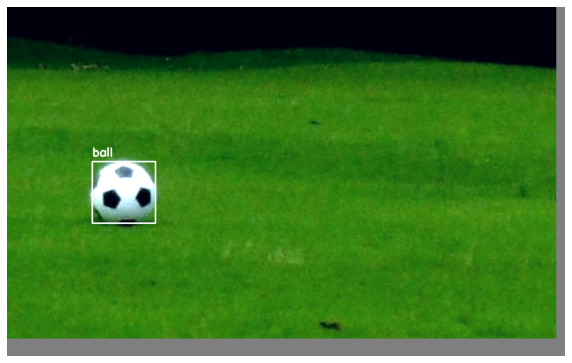

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([55]) tensor([0.5701, 0.4605, 0.3740, 0.3541, 0.2707, 0.2051, 0.1950, 0.1817])
torch.Size([55]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([55, 4]) tensor([[159.5212, 240.8119, 329.2454, 359.4147],
        [358.8644, 460.9690, 388.5306, 492.5199],
        [  3.4626, 222.4412,  65.9601, 327.5664],
        [369.5348, 361.3044, 545.4144, 551.1241],
        [160.9483, 285.8124, 532.0214, 551.9794],
        [459.7227, 434.5638, 526.1867, 532.9198],
        [191.7089, 358.9348, 229.2922, 406.4525],
        [ 25.6353, 243.9058, 528.2141, 837.5353]])


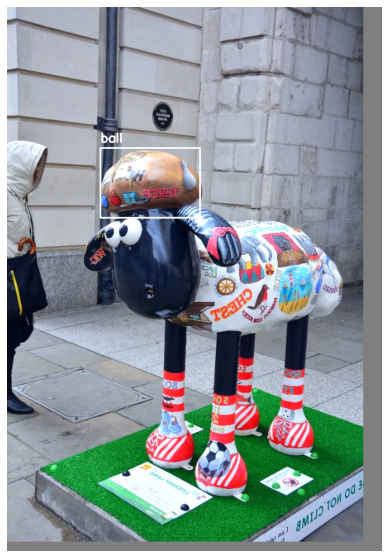

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([19]) tensor([0.7456, 0.4620, 0.1322, 0.1296, 0.0935, 0.0896, 0.0823, 0.0707])
torch.Size([19]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([19, 4]) tensor([[248.2253, 265.3933, 439.6056, 449.9151],
        [  0.0000,  71.9750, 848.3906, 619.1921],
        [118.6371, 248.5549, 411.5992, 471.4186],
        [422.9627,  61.0343, 829.3953, 563.9706],
        [ 26.0686, 109.6986, 345.4925, 535.0214],
        [570.0496, 115.4278, 842.3881, 503.6765],
        [ 36.0322, 259.7162, 279.2650, 549.3428],
        [648.1743, 434.0935, 781.3682, 533.8409]])


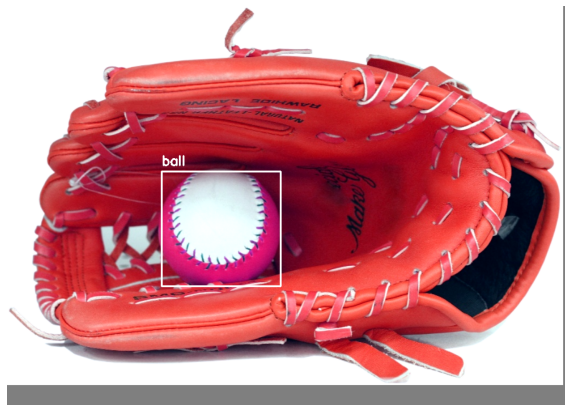

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3]) tensor([0.0708, 0.0647, 0.0602])
torch.Size([3]) tensor([0, 0, 0])
torch.Size([3, 4]) tensor([[395.5788, 449.3206, 473.2826, 496.4433],
        [ 15.6514,  59.4479,  43.0742,  86.7400],
        [424.2745, 473.5846, 469.9233, 495.6791]])


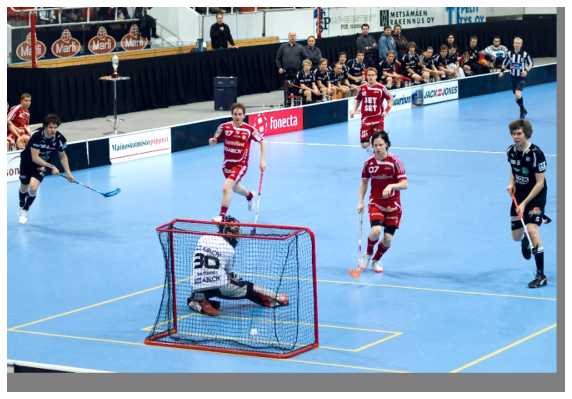

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([29]) tensor([0.6071, 0.5912, 0.5827, 0.3898, 0.3878, 0.1880, 0.1421, 0.1361])
torch.Size([29]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([29, 4]) tensor([[265.2903,  68.3162, 499.7589, 303.9455],
        [ 30.3298,  57.2557, 261.7189, 291.8304],
        [498.8090,  76.5434, 742.7246, 317.9440],
        [  0.0000,  27.0545, 813.0333, 521.4418],
        [753.9570,  91.8600, 930.8711, 337.9899],
        [  4.9803,  31.5890, 314.0944, 400.8678],
        [353.3239,  38.6424, 779.9318, 315.0922],
        [616.7700, 293.2158, 854.1271, 576.9290]])


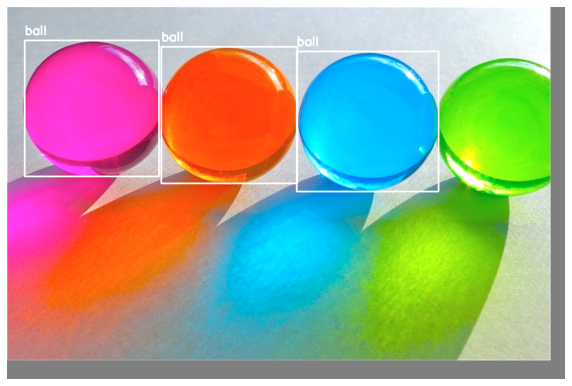

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([16]) tensor([0.9227, 0.7359, 0.3366, 0.2177, 0.1707, 0.1139, 0.1002, 0.0701])
torch.Size([16]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([16, 4]) tensor([[500.1222, 482.9155, 583.9650, 563.5125],
        [371.1299, 472.8570, 463.6840, 563.3623],
        [445.6534, 475.2600, 574.1136, 574.1975],
        [368.8767, 460.1476, 542.2446, 578.9321],
        [414.6984, 453.9538, 500.9186, 553.4932],
        [337.9592, 426.9091, 616.6160, 575.8514],
        [432.2908, 456.3457, 497.4436, 518.2635],
        [218.5934, 369.4226, 276.6215, 430.0830]])


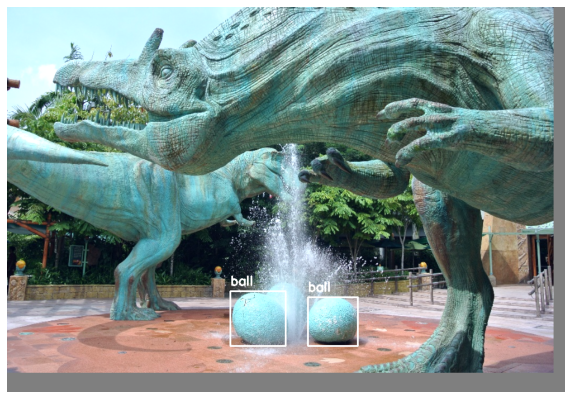

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([7]) tensor([0.9359, 0.0941, 0.0723, 0.0578, 0.0577, 0.0519, 0.0505])
torch.Size([7]) tensor([0, 0, 0, 0, 0, 0, 0])
torch.Size([7, 4]) tensor([[583.8256, 471.7682, 717.6111, 605.3790],
        [552.9777, 422.8815, 743.9471, 611.9226],
        [116.8142, 115.9024, 221.9590, 227.4018],
        [756.0330, 446.8846, 779.3561, 474.8184],
        [ 25.3720, 313.3234,  86.4433, 384.7885],
        [118.4287, 416.3854, 291.7318, 547.2146],
        [499.1159,  47.1210, 554.3440,  73.0339]])


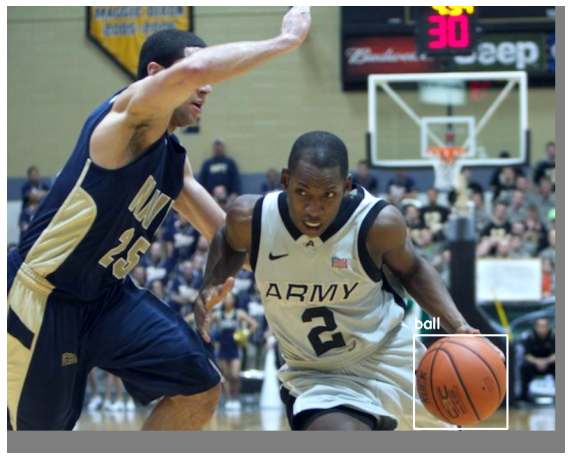

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([14]) tensor([0.2549, 0.1851, 0.1572, 0.1118, 0.0865, 0.0660, 0.0626, 0.0615])
torch.Size([14]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([14, 4]) tensor([[506.3478, 213.3657, 788.4821, 574.6085],
        [452.5632, 347.0806, 520.9288, 416.1190],
        [527.5822, 216.1093, 755.1841, 439.7411],
        [458.0498, 167.4078, 567.5632, 277.6695],
        [263.5190, 149.2939, 775.5271, 557.5525],
        [480.1239, 364.5547, 516.1743, 418.2746],
        [452.7964, 350.9529, 540.7306, 449.8681],
        [495.1185, 418.0742, 549.6282, 477.2372]])


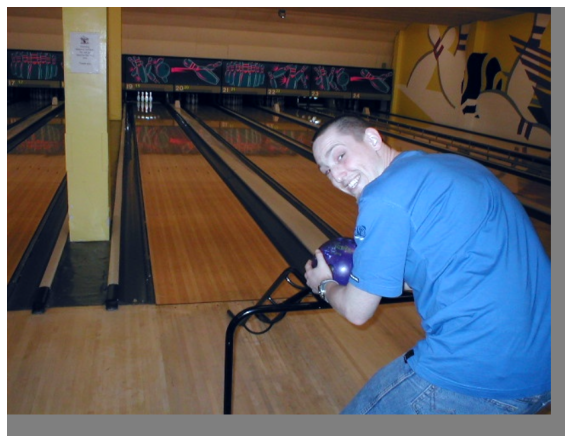

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([5]) tensor([0.9589, 0.0730, 0.0589, 0.0554, 0.0542])
torch.Size([5]) tensor([0, 0, 0, 0, 0])
torch.Size([5, 4]) tensor([[384.3083, 584.5229, 436.2758, 635.6940],
        [  7.3217, 571.8793, 180.7107, 816.9586],
        [ 10.2020, 391.6129, 168.7852, 563.7017],
        [281.5946, 620.4802, 629.4909, 806.5519],
        [  9.6446, 481.5663, 296.7842, 832.0000]])


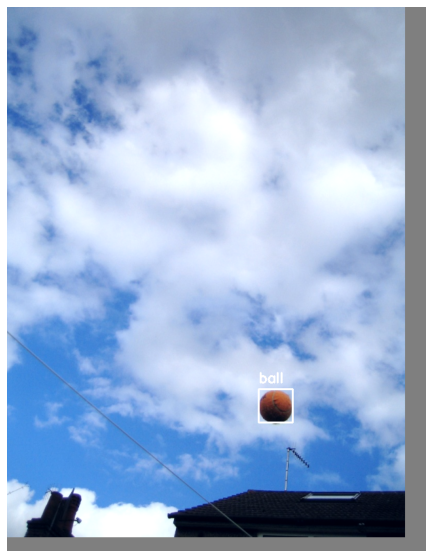

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([20]) tensor([0.6246, 0.2543, 0.2109, 0.1445, 0.0854, 0.0793, 0.0753, 0.0677])
torch.Size([20]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([20, 4]) tensor([[502.0175, 223.4233, 669.0399, 396.3369],
        [133.6808, 183.0056, 223.8033, 296.8597],
        [828.3185, 363.9134, 930.9965, 438.8446],
        [ 49.9861, 341.1152, 106.7218, 403.1732],
        [ 16.9115,  99.3653, 290.2039, 555.4900],
        [  2.9908, 426.3755, 109.8025, 568.4465],
        [110.1540, 215.3605, 271.3378, 418.5764],
        [  0.0000,  36.2595, 851.8250, 596.7924]])


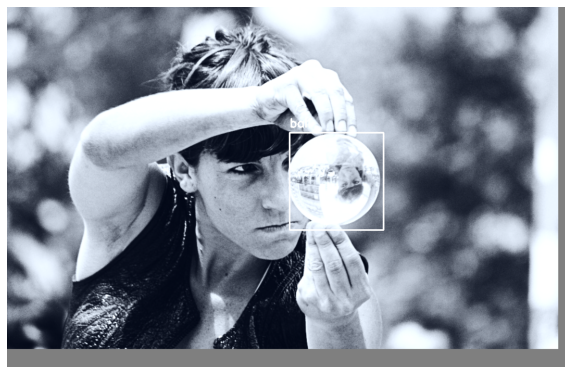

In [32]:
for i in range(10):
    index = np.random.randint(len(train_dataset))
    tensor = train_dataset[index]["img"].unsqueeze(0)
    run_and_show(retinanet, tensor, 0.5, {0: "ball"}, verbose=True)

Пример из валидации:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([8]) tensor([0.9673, 0.0919, 0.0601, 0.0594, 0.0590, 0.0576, 0.0538, 0.0525])
torch.Size([8]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([8, 4]) tensor([[ 83.7709,  78.2928, 508.7126, 502.7243],
        [239.8348, 194.4609, 486.3109, 449.1227],
        [118.9933,  80.6826, 468.6518, 271.0798],
        [200.6995, 390.6628, 289.3721, 442.2563],
        [152.0435, 269.0916, 179.4411, 302.4219],
        [283.8646, 328.4697, 333.6060, 380.6283],
        [115.5496, 203.6646, 300.9055, 408.3362],
        [251.1082,  78.2402, 511.1102, 398.5460]])


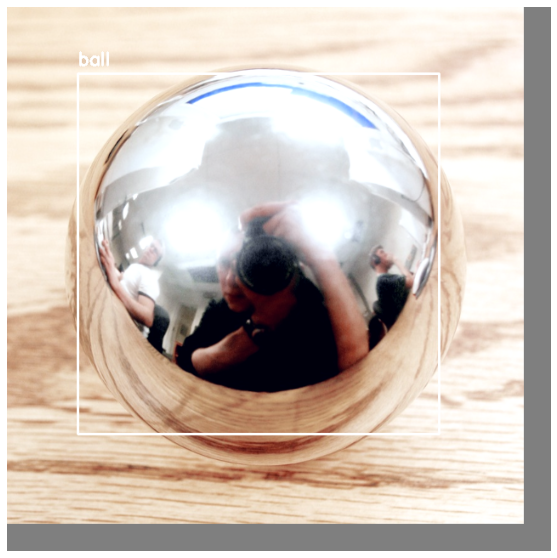

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3]) tensor([0.9750, 0.0600, 0.0506])
torch.Size([3]) tensor([0, 0, 0])
torch.Size([3, 4]) tensor([[296.4057, 358.7339, 376.1337, 440.6509],
        [229.3291, 124.9103, 353.1570, 226.9505],
        [226.2859, 179.8177, 258.2369, 207.3871]])


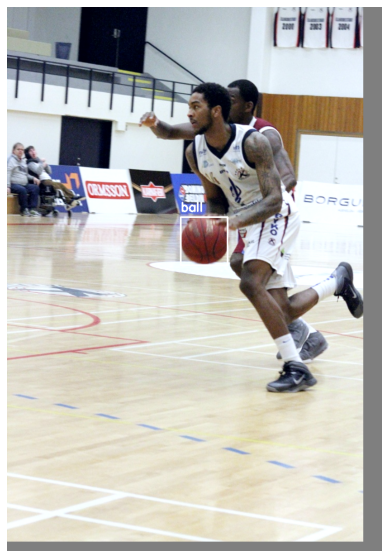

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([6]) tensor([0.9607, 0.2287, 0.1248, 0.1144, 0.0587, 0.0507])
torch.Size([6]) tensor([0, 0, 0, 0, 0, 0])
torch.Size([6, 4]) tensor([[595.2640, 246.3773, 671.5204, 321.9868],
        [ 32.7764, 389.3396, 205.4168, 563.6533],
        [ 47.6727, 391.1941, 174.1316, 474.7253],
        [559.6693, 421.3971, 602.7261, 455.2637],
        [586.0276, 202.9232, 641.2369, 257.5937],
        [665.3408, 236.6672, 721.8977, 301.6641]])


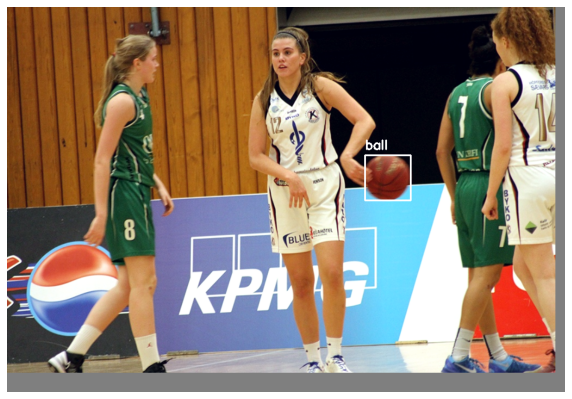

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([7]) tensor([0.5854, 0.1271, 0.0938, 0.0721, 0.0702, 0.0692, 0.0576])
torch.Size([7]) tensor([0, 0, 0, 0, 0, 0, 0])
torch.Size([7, 4]) tensor([[506.7052,  84.6578, 561.4042, 142.3704],
        [463.0951, 515.2266, 527.8715, 582.4332],
        [516.0183,  85.3343, 559.0823, 120.4051],
        [509.8182,  87.1876, 544.8737, 131.2342],
        [679.5712, 113.1808, 704.0114, 140.3853],
        [749.6021, 509.3145, 897.1019, 605.5408],
        [494.8947,  83.6187, 568.7777, 201.0053]])


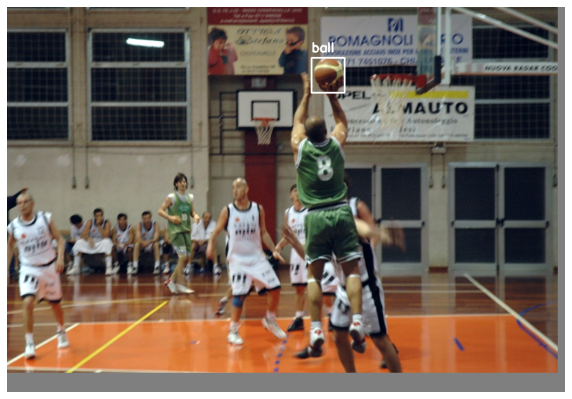

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([6]) tensor([0.3445, 0.1110, 0.0989, 0.0790, 0.0619, 0.0567])
torch.Size([6]) tensor([0, 0, 0, 0, 0, 0])
torch.Size([6, 4]) tensor([[364.8421, 467.1300, 387.2096, 492.2244],
        [548.6426, 180.6841, 645.8718, 269.9401],
        [569.4503, 237.4357, 594.2022, 263.5718],
        [462.5563, 274.2830, 571.0287, 390.8918],
        [555.1041, 180.3018, 612.9463, 226.5579],
        [640.2619, 141.7301, 676.2809, 182.4718]])


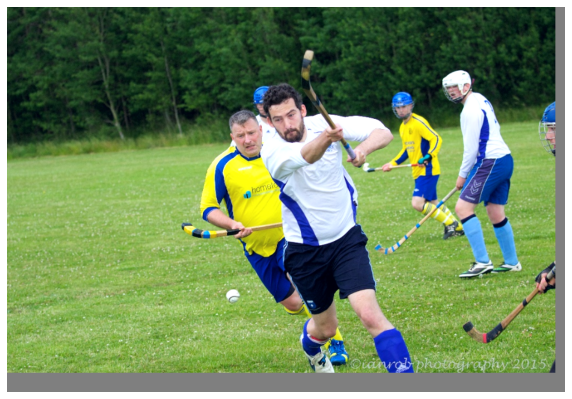

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([39]) tensor([0.7711, 0.3686, 0.1961, 0.1672, 0.1455, 0.1430, 0.1349, 0.1247])
torch.Size([39]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([39, 4]) tensor([[167.6861, 221.1757, 272.0051, 326.5544],
        [102.6281, 239.0588, 728.7223, 601.0457],
        [173.5991, 190.8041, 663.8161, 478.2289],
        [229.2022, 214.4367, 563.3521, 407.5182],
        [466.7587, 218.8899, 536.6456, 280.2510],
        [ 39.4342,  94.2095, 651.4977, 422.4501],
        [289.7224, 234.0464, 408.2298, 362.9484],
        [388.9982, 199.5923, 466.7039, 268.6007]])


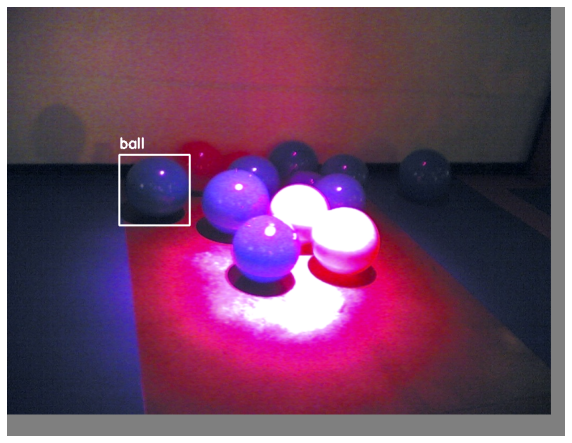

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([17]) tensor([0.8750, 0.7795, 0.4998, 0.1373, 0.1165, 0.1115, 0.0948, 0.0770])
torch.Size([17]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([17, 4]) tensor([[377.4112, 239.5237, 544.7606, 416.0651],
        [  5.6991, 194.2047, 124.4800, 314.3036],
        [532.7021, 205.8159, 659.4158, 330.1948],
        [464.4089, 192.2532, 648.7004, 315.8277],
        [378.0583, 249.9125, 474.9418, 392.0009],
        [381.6940, 194.1175, 685.2755, 382.0290],
        [385.9052, 244.4731, 524.9415, 346.8290],
        [517.2153, 210.7454, 624.6215, 302.3783]])


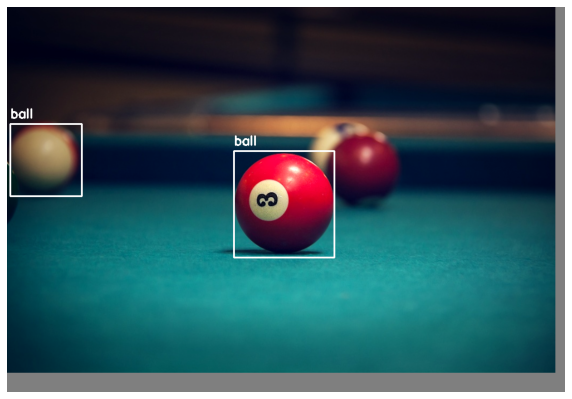

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([6]) tensor([0.1185, 0.0894, 0.0686, 0.0653, 0.0527, 0.0515])
torch.Size([6]) tensor([0, 0, 0, 0, 0, 0])
torch.Size([6, 4]) tensor([[2.1315e+02, 2.8124e+02, 3.7735e+02, 5.0884e+02],
        [3.8283e+02, 7.8603e+02, 4.1008e+02, 8.0929e+02],
        [4.6488e+02, 7.8952e+02, 4.8743e+02, 8.1364e+02],
        [6.8528e-01, 1.3189e+02, 6.4243e+01, 2.5260e+02],
        [1.5770e+00, 1.4186e+02, 4.8978e+01, 2.0592e+02],
        [2.5494e+02, 2.4306e+02, 4.3374e+02, 5.1331e+02]])


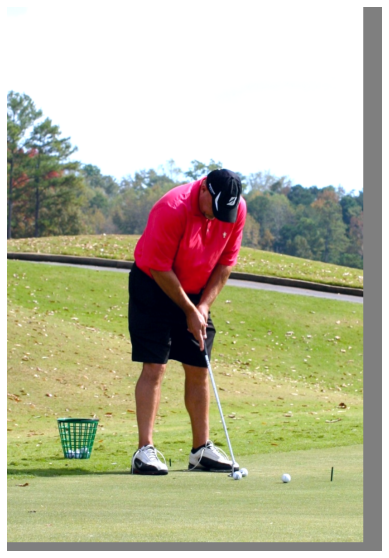

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([38]) tensor([0.8996, 0.7147, 0.6776, 0.6729, 0.2995, 0.1977, 0.1053, 0.1030])
torch.Size([38]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([38, 4]) tensor([[ 60.6618, 177.6368, 120.4258, 239.9779],
        [398.3994, 296.4697, 477.8386, 384.6395],
        [279.0147, 209.4633, 338.9177, 270.7068],
        [506.2383, 445.0829, 627.8647, 571.2726],
        [227.1922, 164.8414, 274.3143, 222.5846],
        [403.6125, 296.8959, 469.1568, 349.6716],
        [236.8603, 178.7808, 459.7826, 290.5449],
        [350.9191, 157.4974, 802.7982, 596.3601]])


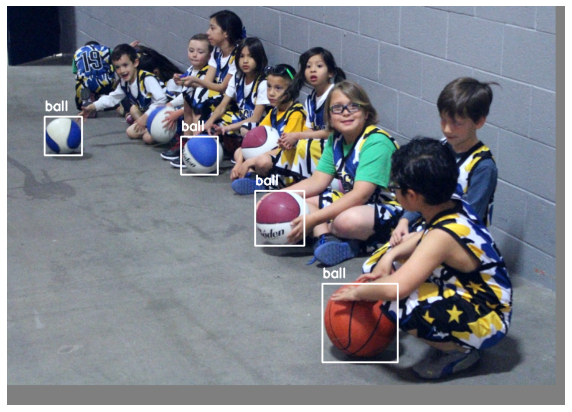

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([12]) tensor([0.3645, 0.1776, 0.1305, 0.0943, 0.0938, 0.0719, 0.0677, 0.0643])
torch.Size([12]) tensor([0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([12, 4]) tensor([[396.9018, 351.7410, 423.0661, 378.3978],
        [  8.3430, 198.6033, 169.8768, 397.0917],
        [415.8367, 203.4484, 493.8536, 254.6172],
        [  0.0000, 231.7714, 128.1100, 475.9859],
        [453.6116, 238.5021, 598.9394, 418.3837],
        [  2.2750, 210.9048, 133.9931, 340.9478],
        [612.9507, 401.1490, 634.1374, 428.6936],
        [393.5735, 192.0231, 495.8431, 270.3600]])


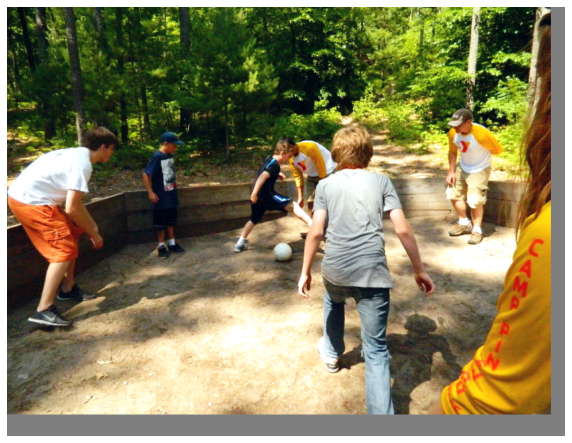

In [33]:
for i in range(10):
    index = np.random.randint(len(val_dataset))
    tensor = val_dataset[index]["img"].unsqueeze(0)
    run_and_show(retinanet, tensor, 0.5, {0: "ball"}, verbose=True)

### Резюме

Если бы мы учили детектор для какой-то конкретной задачи, то:

1. Сделали бы грамотную валидацию (с подсчетом метрик типа `mAP`)
2. Учились бы на нескольких `GPU` (для адекватного размера батча)
3. Более аккуратно подбирали якорные боксы
4. По возможности использовали библиотечные модели (а не кустарные)